# Lab 3 Practical Assessment: Image Captioning

The model is trained and evaluated in Google Colab using GPU.

In [1]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


In [2]:
!pip install datasets nltk tensorboard -q

In [3]:
!pip install -q datasets nltk tqdm
!pip install -q evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.4 MB/s eta 0:00:00


In [18]:
import matplotlib.pyplot as plt


## Training

In [4]:
import torch
from torch import nn
from torchvision.models import VGG16_Weights, vgg16


In [5]:
class Encoder(nn.Module):

    def __init__(self, encoded_image_size=14):
        super().__init__()
        vgg = vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        self.features = nn.Sequential(*list(vgg.features.children())[:-1])
        self.pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

        # Freeze most of VGG16, fine-tune only the last convolutional block.
        for param in self.features.parameters():
            param.requires_grad = False
        for layer in list(self.features.children())[24:]:
            for param in layer.parameters():
                param.requires_grad = True

    def forward(self, images):
        features = self.features(images)          # (batch, 512, H/16, W/16)
        features = self.pool(features)           # (batch, 512, 14, 14)
        features = features.permute(0, 2, 3, 1)  # (batch, 14, 14, 512)
        return features



In [6]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        self.full_att = nn.Linear(attention_dim, 1)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, encoder_out, decoder_hidden):
        if encoder_out.dim() == 4:
            batch_size = encoder_out.size(0)
            encoder_dim = encoder_out.size(-1)
            encoder_out = encoder_out.view(batch_size, -1, encoder_dim)

        att1 = self.encoder_att(encoder_out)
        att2 = self.decoder_att(decoder_hidden)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)
        alpha = self.softmax(att)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)

        return attention_weighted_encoding, alpha


In [7]:
class DecoderWithAttention(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=512, dropout=0.5):
        super().__init__()

        self.encoder_dim = encoder_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)

        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim)

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)

        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.fc = nn.Linear(decoder_dim, vocab_size)

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)

        if encoder_out.dim() == 4:
            encoder_out = encoder_out.view(batch_size, -1, self.encoder_dim)

        num_pixels = encoder_out.size(1)

        caption_lengths, sort_ind = caption_lengths.squeeze(1).sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]

        embeddings = self.embedding(encoded_captions)

        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)

        decode_lengths = (caption_lengths - 1).tolist()
        max_decode_length = max(decode_lengths)

        predictions = torch.zeros(batch_size, max_decode_length, self.vocab_size).to(encoder_out.device)
        alphas = torch.zeros(batch_size, max_decode_length, num_pixels).to(encoder_out.device)

        for t in range(max_decode_length):
            batch_size_t = sum(length > t for length in decode_lengths)

            attention_weighted_encoding, alpha = self.attention(
                encoder_out[:batch_size_t],
                h[:batch_size_t]
            )

            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            attention_weighted_encoding = gate * attention_weighted_encoding

            h_t, c_t = self.decode_step(
                torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t])
            )

            h = h.clone()
            c = c.clone()
            h[:batch_size_t] = h_t
            c[:batch_size_t] = c_t

            predictions[:batch_size_t, t, :] = self.fc(self.dropout(h_t))
            alphas[:batch_size_t, t, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, sort_ind


In [8]:
import random
import re
from collections import Counter

import torch
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.models import VGG16_Weights, vgg16
from datasets import load_dataset
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

class Vocabulary:
    def __init__(self, min_freq=5):
        self.word2idx = {"<pad>": 0, "<start>": 1, "<end>": 2, "<unk>": 3}
        self.idx2word = {0: "<pad>", 1: "<start>", 2: "<end>", 3: "<unk>"}
        self.min_freq = min_freq

    def __len__(self):
        return len(self.word2idx)

    def tokenize(self, text):
        return re.findall(r"[A-Za-z0-9_]+", text.lower())

    def build(self, captions):
        counter = Counter()
        for caption in captions:
            counter.update(self.tokenize(caption))

        for word, freq in counter.items():
            if freq >= self.min_freq and word not in self.word2idx:
                idx = len(self.word2idx)
                self.word2idx[word] = idx
                self.idx2word[idx] = word

    def encode(self, caption):
        tokens = ["<start>"] + self.tokenize(caption) + ["<end>"]
        return [self.word2idx.get(token, self.word2idx["<unk>"]) for token in tokens]


def get_captions(example):
    if "caption" in example:
        value = example["caption"]
        return value if isinstance(value, list) else [value]

    if "captions" in example:
        value = example["captions"]
        return value if isinstance(value, list) else [value]

    captions = []
    for key, value in example.items():
        if "caption" in key.lower() and isinstance(value, str):
            captions.append(value)
    return captions


class Flickr8kCaptionDataset(Dataset):
    def __init__(self, hf_dataset, vocab, transform=None, max_len=50):
        self.hf_dataset = hf_dataset
        self.vocab = vocab
        self.transform = transform
        self.max_len = max_len

    def __len__(self):
        return len(self.hf_dataset)

    def __getitem__(self, idx):
        example = self.hf_dataset[idx]
        image = example["image"].convert("RGB")
        caption = random.choice(get_captions(example))

        if self.transform is not None:
            image = self.transform(image)

        caption = torch.tensor(self.vocab.encode(caption)[:self.max_len], dtype=torch.long)
        caption_length = torch.tensor([len(caption)], dtype=torch.long)

        return image, caption, caption_length


def collate_fn(batch):
    images, captions, lengths = zip(*batch)
    images = torch.stack(images, dim=0)
    lengths = torch.stack(lengths, dim=0)

    max_len = max(caption.size(0) for caption in captions)
    padded_captions = torch.zeros(len(captions), max_len, dtype=torch.long)

    for i, caption in enumerate(captions):
        padded_captions[i, :caption.size(0)] = caption

    return images, padded_captions, lengths


def build_vocab_from_dataset(hf_dataset, min_freq=5):
    all_captions = []
    for example in hf_dataset:
        all_captions.extend(get_captions(example))

    vocab = Vocabulary(min_freq=min_freq)
    vocab.build(all_captions)
    return vocab


def tensor_to_words(token_ids, vocab):
    words = []
    for token_id in token_ids:
        word = vocab.idx2word.get(int(token_id), "<unk>")
        if word in ["<pad>", "<start>"]:
            continue
        if word == "<end>":
            break
        words.append(word)
    return words


def batch_bleu(scores, targets, decode_lengths, vocab):
    predicted_ids = scores.argmax(dim=2).detach().cpu()
    targets = targets.detach().cpu()

    references = []
    hypotheses = []

    for i, length in enumerate(decode_lengths):
        reference = tensor_to_words(targets[i, :length], vocab)
        hypothesis = tensor_to_words(predicted_ids[i, :length], vocab)

        if len(reference) > 0 and len(hypothesis) > 0:
            references.append([reference])
            hypotheses.append(hypothesis)

    if len(hypotheses) == 0:
        return 0.0

    smoothing = SmoothingFunction().method1
    return corpus_bleu(references, hypotheses, smoothing_function=smoothing)


def run_one_epoch(encoder, decoder, data_loader, criterion, optimizer, vocab, device, train=True):
    if train:
        encoder.train()
        decoder.train()
    else:
        encoder.eval()
        decoder.eval()

    total_loss = 0.0
    total_bleu = 0.0
    total_batches = 0

    for images, captions, lengths in data_loader:
        images = images.to(device)
        captions = captions.to(device)
        lengths = lengths.to(device)

        with torch.set_grad_enabled(train):
            encoder_out = encoder(images)
            scores, captions_sorted, decode_lengths, alphas, sort_ind = decoder(
                encoder_out, captions, lengths
            )

            targets = captions_sorted[:, 1:]

            loss_scores = pack_padded_sequence(
                scores, decode_lengths, batch_first=True
            ).data
            loss_targets = pack_padded_sequence(
                targets, decode_lengths, batch_first=True
            ).data

            loss = criterion(loss_scores, loss_targets)

            if train:
                optimizer.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(decoder.parameters(), 5.0)
                optimizer.step()

        bleu = batch_bleu(scores, targets, decode_lengths, vocab)

        total_loss += loss.item()
        total_bleu += bleu
        total_batches += 1

    return total_loss / total_batches, total_bleu / total_batches


In [9]:
import random
import re
from collections import Counter

import torch
from torch import nn
from torch.nn.utils.rnn import pack_padded_sequence
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.models import VGG16_Weights, vgg16
from datasets import load_dataset
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction


In [10]:
def train_validate(
    epochs,
    batch_size=32,
    learning_rate=1e-4,
    attention_dim=512,
    embed_dim=512,
    decoder_dim=512,
    min_word_freq=5,
    patience=3,
    val_fraction=0.1,
    max_caption_len=50,
    best_model_path="best_vgg16_caption_model.pth",
    num_workers=2,
    use_tensorboard=True,
    log_dir="runs/vgg16_flickr8k",
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Device:", device)

    print("Loading data...")
    dataset_dict = load_dataset("jxie/flickr8k")
    print("Data loaded")
    hf_dataset = dataset_dict["train"] if "train" in dataset_dict else dataset_dict[list(dataset_dict.keys())[0]]

    print("Building vocabulary...")
    vocab = build_vocab_from_dataset(hf_dataset, min_freq=min_word_freq)
    print("Vocabulary built")

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])

    dataset = Flickr8kCaptionDataset(
        hf_dataset=hf_dataset,
        vocab=vocab,
        transform=transform,
        max_len=max_caption_len,
    )

    val_size = int(len(dataset) * val_fraction)
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        collate_fn=collate_fn,
        num_workers=num_workers,
        pin_memory=True,
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        collate_fn=collate_fn,
        num_workers=num_workers,
        pin_memory=True,
    )

    encoder = Encoder().to(device)
    decoder = DecoderWithAttention(
        attention_dim=attention_dim,
        embed_dim=embed_dim,
        decoder_dim=decoder_dim,
        vocab_size=len(vocab),
    ).to(device)

    criterion = nn.CrossEntropyLoss().to(device)
    optimizer = torch.optim.Adam(
        list(filter(lambda p: p.requires_grad, encoder.parameters())) + list(decoder.parameters()),
        lr=learning_rate,
    )

    best_val_bleu = 0.0
    epochs_without_improvement = 0
    history = {"train_loss": [], "val_loss": [], "train_bleu": [], "val_bleu": []}
    writer = SummaryWriter(log_dir=log_dir) if use_tensorboard else None

    print("Starting the training process")
    for epoch in range(epochs):
        train_loss, train_bleu = run_one_epoch(
            encoder, decoder, train_loader, criterion, optimizer, vocab, device, train=True
        )

        val_loss, val_bleu = run_one_epoch(
            encoder, decoder, val_loader, criterion, optimizer, vocab, device, train=False
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_bleu"].append(train_bleu)
        history["val_bleu"].append(val_bleu)

        print(
            f"Epoch [{epoch + 1}/{epochs}] "
            f"train_loss: {train_loss:.4f} "
            f"val_loss: {val_loss:.4f} "
            f"train_bleu: {train_bleu:.4f} "
            f"val_bleu: {val_bleu:.4f}"
        )

        if writer is not None:
            writer.add_scalar("Loss/train", train_loss, epoch + 1)
            writer.add_scalar("Loss/validation", val_loss, epoch + 1)
            writer.add_scalar("BLEU/train", train_bleu, epoch + 1)
            writer.add_scalar("BLEU/validation", val_bleu, epoch + 1)
            writer.flush()

        if val_bleu > best_val_bleu:
            best_val_bleu = val_bleu
            epochs_without_improvement = 0

            torch.save(
                {
                    "epoch": epoch + 1,
                    "encoder_state_dict": encoder.state_dict(),
                    "decoder_state_dict": decoder.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "best_val_bleu": best_val_bleu,
                    "vocab": vocab,
                    "history": history,
                },
                best_model_path,
            )
            print(f"Saved best model to {best_model_path} with val_bleu: {best_val_bleu:.4f}")
        else:
            epochs_without_improvement += 1
            print(f"No BLEU improvement for {epochs_without_improvement} epoch(s)")

            if epochs_without_improvement >= patience:
                print("Early stopping triggered")
                break

    if writer is not None:
        writer.close()

    return encoder, decoder, vocab, history


In [12]:
encoder, decoder, vocab, history = train_validate(
    epochs=150,
    batch_size=16,
    patience=20,
    use_tensorboard=True,
    log_dir="runs/vgg16_flickr8k"
)

Device: cuda
Loading data...
Data loaded
Building vocabulary...
Vocabulary built
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:05<00:00, 102MB/s]


Starting the training process
Epoch [1/150] train_loss: 5.1446 val_loss: 4.5161 train_bleu: 0.0090 val_bleu: 0.0166
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0166
Epoch [2/150] train_loss: 4.3878 val_loss: 4.1944 train_bleu: 0.0181 val_bleu: 0.0226
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0226
Epoch [3/150] train_loss: 4.1099 val_loss: 3.9789 train_bleu: 0.0253 val_bleu: 0.0286
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0286
Epoch [4/150] train_loss: 3.9367 val_loss: 3.8570 train_bleu: 0.0274 val_bleu: 0.0298
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0298
Epoch [5/150] train_loss: 3.8030 val_loss: 3.6936 train_bleu: 0.0319 val_bleu: 0.0363
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0363
Epoch [6/150] train_loss: 3.6777 val_loss: 3.6444 train_bleu: 0.0360 val_bleu: 0.0365
Saved best model to best_vgg16_caption_model.pth with val_bleu: 0.0365
Epoch [7/150] train_loss: 3.

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [49]:
#%reload_ext tensorboard

## Testing

In [14]:
def generate_caption_beam_search(
    encoder,
    decoder,
    image,
    vocab,
    beam_size=3,
    max_len=50,
    device=None,
):
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")

    encoder.eval()
    decoder.eval()

    start_token = vocab.word2idx["<start>"]
    end_token = vocab.word2idx["<end>"]
    pad_token = vocab.word2idx["<pad>"]

    if image.dim() == 3:
        image = image.unsqueeze(0)

    image = image.to(device)

    with torch.no_grad():
        encoder_out = encoder(image)
        encoder_out = encoder_out.view(1, -1, decoder.encoder_dim)

        num_pixels = encoder_out.size(1)
        encoder_out = encoder_out.expand(beam_size, num_pixels, decoder.encoder_dim)

        mean_encoder_out = encoder_out.mean(dim=1)
        h = decoder.init_h(mean_encoder_out)
        c = decoder.init_c(mean_encoder_out)

        previous_words = torch.full(
            (beam_size, 1),
            start_token,
            dtype=torch.long,
            device=device,
        )

        sequences = previous_words
        top_scores = torch.zeros(beam_size, 1, device=device)

        complete_sequences = []
        complete_scores = []

        step = 1
        active_beams = beam_size

        while True:
            embeddings = decoder.embedding(previous_words).squeeze(1)

            attention_weighted_encoding, alpha = decoder.attention(
                encoder_out,
                h,
            )

            gate = decoder.sigmoid(decoder.f_beta(h))
            attention_weighted_encoding = gate * attention_weighted_encoding

            h, c = decoder.decode_step(
                torch.cat([embeddings, attention_weighted_encoding], dim=1),
                (h, c),
            )

            scores = decoder.fc(h)
            scores = torch.log_softmax(scores, dim=1)
            scores = scores + top_scores.expand_as(scores)

            if step == 1:
                top_scores, top_words = scores[0].topk(active_beams, dim=0)
            else:
                top_scores, top_words = scores.view(-1).topk(active_beams, dim=0)

            previous_beam_indices = torch.div(
                top_words,
                decoder.vocab_size,
                rounding_mode="floor",
            )

            next_word_indices = top_words % decoder.vocab_size

            sequences = torch.cat(
                [
                    sequences[previous_beam_indices],
                    next_word_indices.unsqueeze(1),
                ],
                dim=1,
            )

            incomplete_indices = []
            complete_indices = []

            for index, word in enumerate(next_word_indices):
                if word.item() == end_token:
                    complete_indices.append(index)
                else:
                    incomplete_indices.append(index)

            if len(complete_indices) > 0:
                complete_sequences.extend(sequences[complete_indices].tolist())
                complete_scores.extend(top_scores[complete_indices].tolist())

            active_beams = active_beams - len(complete_indices)

            if active_beams == 0 or step >= max_len:
                break

            sequences = sequences[incomplete_indices]
            h = h[previous_beam_indices[incomplete_indices]]
            c = c[previous_beam_indices[incomplete_indices]]
            encoder_out = encoder_out[previous_beam_indices[incomplete_indices]]
            top_scores = top_scores[incomplete_indices].unsqueeze(1)
            previous_words = next_word_indices[incomplete_indices].unsqueeze(1)

            step += 1

    if len(complete_sequences) > 0:
        best_index = complete_scores.index(max(complete_scores))
        best_sequence = complete_sequences[best_index]
    else:
        best_sequence = sequences[0].tolist()

    words = []

    for token_id in best_sequence:
        if token_id in [start_token, end_token, pad_token]:
            continue

        words.append(vocab.idx2word.get(token_id, "<unk>"))

    return words

In [15]:
def test_beam_search(
    best_model_path="best_vgg16_caption_model.pth",
    beam_size=3,
    max_len=50,
    attention_dim=512,
    embed_dim=512,
    decoder_dim=512,
    limit=None,
    print_examples=5,
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    checkpoint = torch.load(
        best_model_path,
        map_location=device,
        weights_only=False,
    )

    vocab = checkpoint["vocab"]

    encoder = Encoder().to(device)

    decoder = DecoderWithAttention(
        attention_dim=attention_dim,
        embed_dim=embed_dim,
        decoder_dim=decoder_dim,
        vocab_size=len(vocab),
    ).to(device)

    encoder.load_state_dict(checkpoint["encoder_state_dict"])
    decoder.load_state_dict(checkpoint["decoder_state_dict"])

    dataset_dict = load_dataset("jxie/flickr8k")

    if "test" in dataset_dict:
        test_dataset = dataset_dict["test"]
    elif "validation" in dataset_dict:
        test_dataset = dataset_dict["validation"]
    else:
        test_dataset = dataset_dict["train"]

    if limit is not None:
        test_dataset = test_dataset.select(
            range(min(limit, len(test_dataset)))
        )

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])

    references = []
    hypotheses = []
    examples = []

    for example in test_dataset:
        original_image = example["image"].convert("RGB")
        image = transform(original_image)

        generated_words = generate_caption_beam_search(
            encoder=encoder,
            decoder=decoder,
            image=image,
            vocab=vocab,
            beam_size=beam_size,
            max_len=max_len,
            device=device,
        )

        reference_captions = [
            vocab.tokenize(caption)
            for caption in get_captions(example)
        ]

        if len(reference_captions) == 0 or len(generated_words) == 0:
            continue

        references.append(reference_captions)
        hypotheses.append(generated_words)

        if len(examples) < print_examples:
            examples.append(
                (
                    original_image,
                    generated_words,
                    get_captions(example),
                )
            )

    smoothing = SmoothingFunction().method1

    bleu = corpus_bleu(
        references,
        hypotheses,
        smoothing_function=smoothing,
    )

    print(f"Test BLEU with beam size {beam_size}: {bleu:.4f}")

    for i, (original_image, generated_words, reference_captions) in enumerate(examples):
        generated_caption = " ".join(generated_words)

        plt.figure(figsize=(6, 6))
        plt.imshow(original_image)
        plt.axis("off")
        plt.show()

        print(f"Example {i + 1}")
        print("Generated:", generated_caption)
        print("Reference:", reference_captions[0])
        print("-" * 80)

    return bleu

Test BLEU with beam size 3: 0.1920


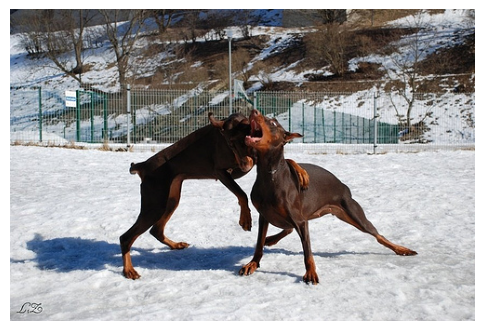

Example 1
Generated: a brown dog in the snow
Reference: The dogs are in the snow in front of a fence .
--------------------------------------------------------------------------------


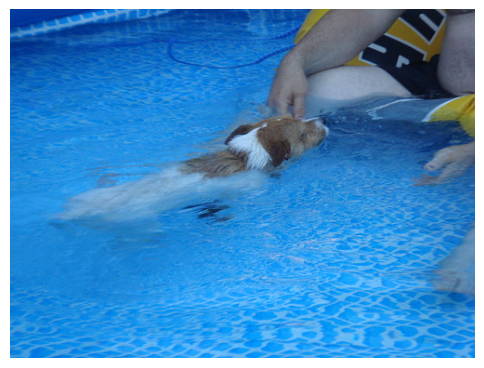

Example 2
Generated: a white and brown dog is playing in a pool
Reference: a brown and white dog swimming towards some in the pool
--------------------------------------------------------------------------------


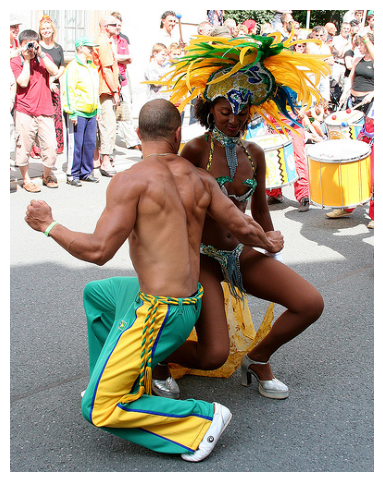

Example 3
Generated: a young boy wearing a blue shirt and blue jeans is sitting on a trampoline
Reference: A man and a woman in festive costumes dancing .
--------------------------------------------------------------------------------


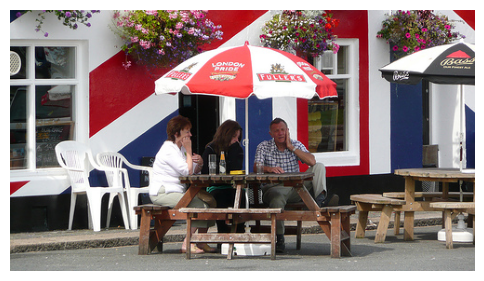

Example 4
Generated: a woman in a red shirt and jeans is sitting on a bench with a woman in a red shirt
Reference: A couple of people sit outdoors at a table with an umbrella and talk .
--------------------------------------------------------------------------------


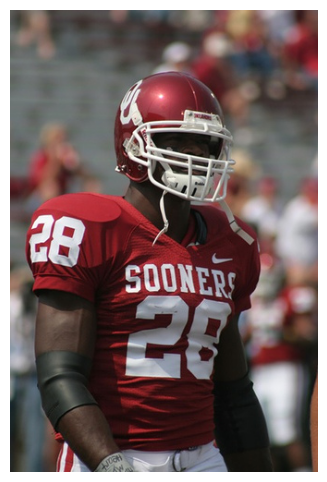

Example 5
Generated: a football player in a red uniform and a red uniform
Reference: A man is wearing a Sooners red football shirt and helmet .
--------------------------------------------------------------------------------


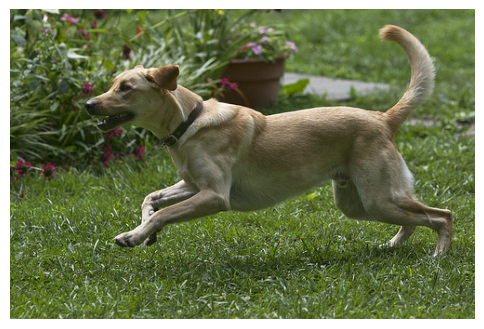

Example 6
Generated: a dog runs through the grass
Reference: A brown dog running
--------------------------------------------------------------------------------


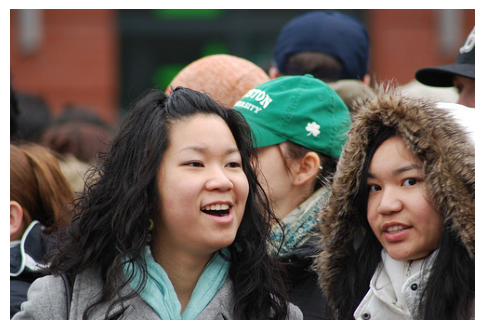

Example 7
Generated: a woman in a blue shirt and a girl in a pink shirt
Reference: A girl with dark brown hair and eyes in a blue scarf is standing next to a girl in a fur edged coat .
--------------------------------------------------------------------------------


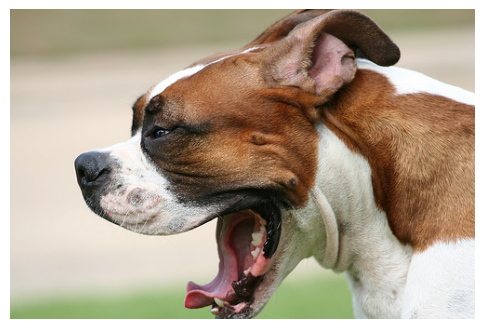

Example 8
Generated: a brown and white dog is playing with a toy
Reference: A dog with its mouth opened .
--------------------------------------------------------------------------------


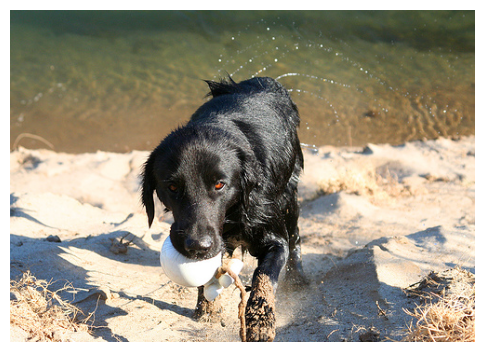

Example 9
Generated: a black dog is standing in the snow
Reference: A black dog emerges from the water onto the sand , holding a white object in its mouth .
--------------------------------------------------------------------------------


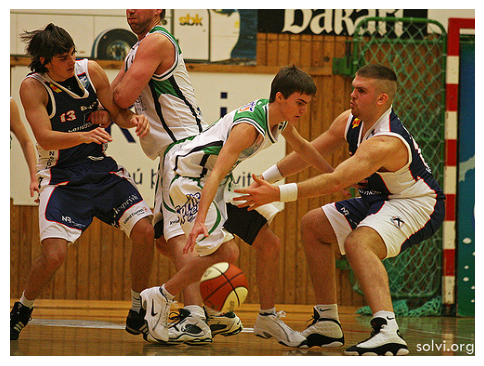

Example 10
Generated: a group of men are playing basketball
Reference: A player from the white and green highschool team dribbles down court defended by a player from the other team .
--------------------------------------------------------------------------------


In [19]:
bleu = test_beam_search(
    best_model_path="/content/best_vgg16_caption_model.pth",
    beam_size=3,
    max_len=50,
    limit=500,
    print_examples=10)